## Imports and data

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import pcn
from hpc.models import PatternAssociator, PATrainer
import matplotlib.pyplot as plt
import numpy as np
from hpc import utils
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from pcn.models import PCModel
from pcn import plotting
from sklearn.model_selection import train_test_split
import torch.nn as nn
from hpc.layers import SparseLayer

In [2]:
dataset = torch.load(f'data/cifar10_patterns.pt')

pcn.utils.seed(0)
g = torch.Generator()
g.manual_seed(0)

N_train = int(0.8*len(dataset['ca3']))
tensor_dataset = TensorDataset(dataset['ca3'][:N_train], dataset['ec'][:N_train])
train_loader = DataLoader(
    tensor_dataset, 
    batch_size=1, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

pcn.utils.seed(0)
g = torch.Generator()
g.manual_seed(0)
test_loader = DataLoader(
    tensor_dataset, 
    batch_size=1, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g # same order as for train_loader
) 

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_7688\655519891.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dataset = torch.load(f'data/cifar10_patterns.pt')


In [3]:
n_ca3 = dataset['ca3'].shape[1]
n_ec = dataset['ec'].shape[1]

In [4]:
ca3_mean = dataset['ca3'].mean(dim=0)

(array([2.7000e+01, 2.4300e+02, 2.7450e+03, 1.8789e+04, 6.2978e+04,
        7.3566e+04, 2.8222e+04, 4.9050e+03, 4.8500e+02, 4.0000e+01]),
 array([-0.40276513, -0.3243089 , -0.24585268, -0.16739646, -0.08894023,
        -0.01048401,  0.06797221,  0.14642844,  0.22488466,  0.30334088,
         0.38179713]),
 <BarContainer object of 10 artists>)

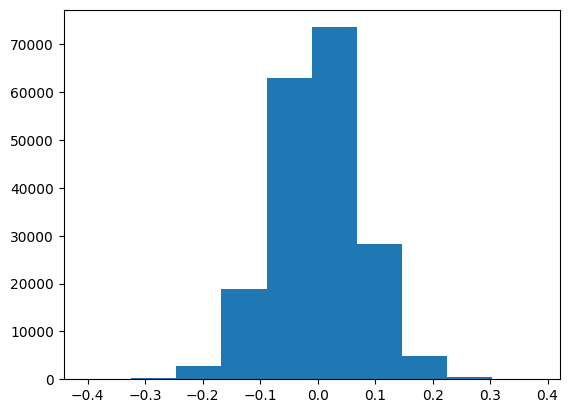

In [5]:
plt.hist(dataset['ec'].flatten())

In [6]:
p = n_ec/(1.1*10**5)
n_ca1 = round(3.9*10**5*p)

## Direct connection

In [6]:
lrs = sorted([2*i/10**(5-j) for i in range(1, 5) for j in range(7)])

### Hebb rule

#### Uncentered

In [7]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=test_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=torch.zeros(1), 
    use_bias=False, 
    delta=False, 
    act_fn=torch.tanh,
    f=1
)

In [8]:
argmin, min

(0.0002, np.float64(0.07581555896467762))

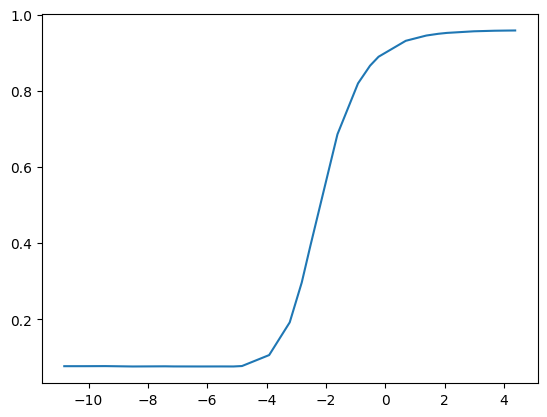

In [9]:
plt.plot(np.log(lrs), errors)

#### Centered

In [20]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=test_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=ca3_mean, 
    use_bias=False, 
    delta=False,
    act_fn=torch.tanh,
    f=1
)

In [21]:
argmin, min

(0.002, 0.2220771312713623)

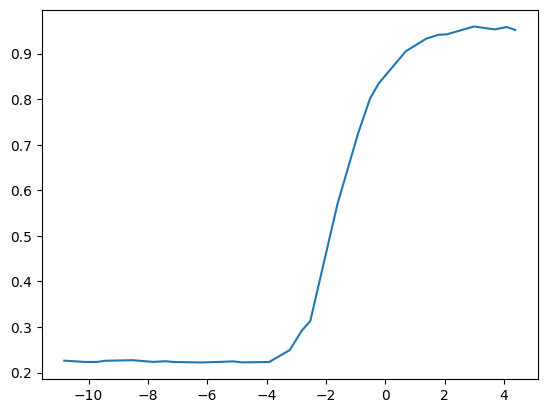

In [22]:
plt.plot(np.log(lrs), errors)

### Delta rule

#### Uncentered

In [7]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=test_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=torch.zeros(1), 
    use_bias=True, 
    delta=True,
    act_fn=torch.tanh,
    f=1
)

In [8]:
argmin, min

(0.02, np.float64(0.013469698178141698))

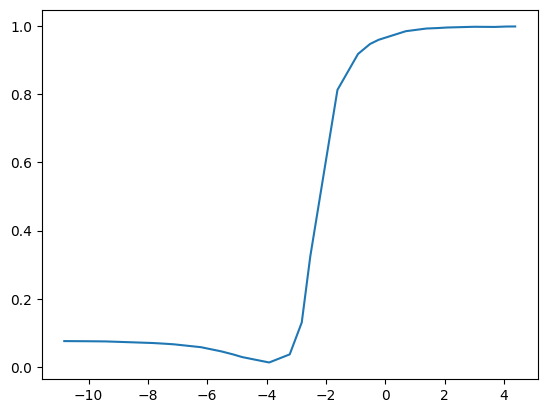

In [9]:
plt.plot(np.log(lrs), errors)

In [10]:
model = PatternAssociator(
    in_size=n_ca3, 
    in_mean=torch.zeros(1),
    out_size=n_ec, 
    act_fn=torch.tanh, 
    use_bias=True, 
    c=1, 
    f=1, 
    delta=True,
    glorot_init=True
)
optimizer = pcn.optim.get_optim(
            [model.layer],
            "SGD",
            argmin,
            batch_scale=True,
            grad_clip=None,
            weight_decay=None
        )
trainer = PATrainer(model, optimizer)

Epoch 1/2
All patterns: 0.0056
Last 20 patterns: 0.0013
Epoch 2/2
All patterns: 0.0033
Last 20 patterns: 0.0008


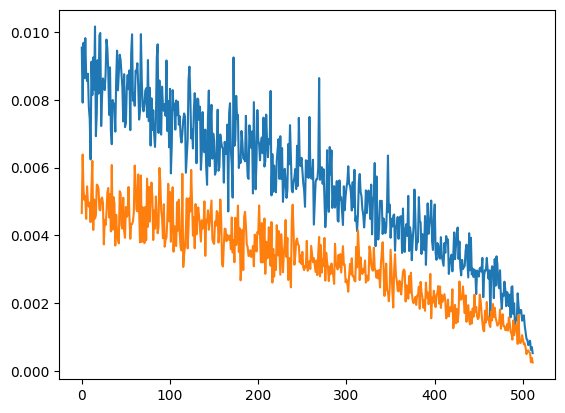

In [13]:
n_epochs = 2
with torch.no_grad():
    for epoch in range(n_epochs):
        print(f"Epoch {epoch+1}/{n_epochs}")
        trainer.train(train_loader, epoch)
        errors = trainer.test(test_loader)
        plt.plot(errors)
        print(f"All patterns: {np.mean(errors):.4f}")
        print(f"Last 20 patterns: {np.mean(errors[-20:]):.4f}")

#### Centered

In [14]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=test_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=ca3_mean, 
    use_bias=True, 
    delta=True,
    act_fn=torch.tanh,
    f=1
)

In [15]:
argmin, min

(0.02, np.float64(0.011591405600029248))

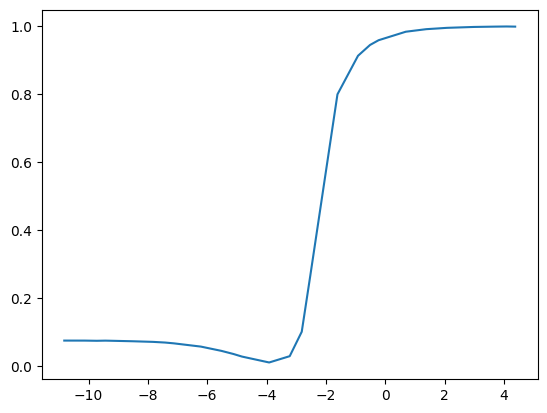

In [16]:
plt.plot(np.log(lrs), errors)

In [17]:
model = PatternAssociator(
    in_size=n_ca3, 
    in_mean=ca3_mean,
    out_size=n_ec, 
    act_fn=torch.tanh, 
    use_bias=True, 
    c=1, 
    f=1, 
    delta=True,
    glorot_init=True
)
optimizer = pcn.optim.get_optim(
            [model.layer],
            "SGD",
            argmin,
            batch_scale=True,
            grad_clip=None,
            weight_decay=None
        )
trainer = PATrainer(model, optimizer)

Epoch 1/2
All patterns: 0.0049
Last 20 patterns: 0.0011
Epoch 2/2
All patterns: 0.0028
Last 20 patterns: 0.0007


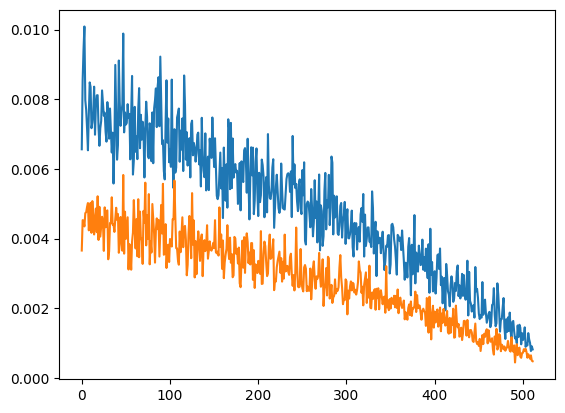

In [19]:
n_epochs = 2
with torch.no_grad():
    for epoch in range(n_epochs):
        print(f"Epoch {epoch+1}/{n_epochs}")
        trainer.train(train_loader, epoch)
        errors = trainer.test(test_loader)
        plt.plot(errors)
        print(f"All patterns: {np.mean(errors):.4f}")
        print(f"Last 20 patterns: {np.mean(errors[-20:]):.4f}")

### Comparison 

In [53]:
columns = ['delta', 'centering', 'argmin', 'min', 'iter', 'pattern', 'error']

In [22]:
n_trials = 10
data = []

with torch.no_grad():
    for delta in [False, True]:
        for centering in [False, True]:

            print(f"Delta: {delta}, Centering: {centering}")
            in_mean = ca3_mean if centering else torch.zeros(1)
            (argmin, min), errors = utils.best_lr(
                lrs=lrs, 
                train_loader=train_loader, 
                test_loader=test_loader, 
                in_size=n_ca3, 
                out_size=n_ec,
                act_fn=torch.tanh, 
                in_mean=in_mean, 
                use_bias=delta, 
                delta=delta,
                f=1
                )
            
            for i in tqdm(range(n_trials)):

                pcn.utils.seed(i)
                g = torch.Generator()
                g.manual_seed(i)

                train_loader = DataLoader(
                    tensor_dataset, 
                    batch_size=1, 
                    shuffle=True, # different order at each trial
                    worker_init_fn=pcn.utils.seed_worker, 
                    generator=g
                )
                
                pcn.utils.seed(i)
                g = torch.Generator()
                g.manual_seed(i)

                test_loader = DataLoader(
                    tensor_dataset, 
                    batch_size=1, 
                    shuffle=True, 
                    worker_init_fn=pcn.utils.seed_worker, 
                    generator=g
                )
                
                model = PatternAssociator(
                    in_size=n_ca3, 
                    in_mean=in_mean,
                    out_size=n_ec, 
                    act_fn=torch.tanh, 
                    use_bias=delta, 
                    c=1, 
                    f=1, 
                    delta=delta,
                    glorot_init=True
                )
                optimizer = pcn.optim.get_optim(
                            [model.layer],
                            "SGD",
                            argmin,
                            batch_scale=True,
                            grad_clip=None,
                            weight_decay=None
                        )
                trainer = PATrainer(model, optimizer)            
                trainer.train(train_loader, 0) 
                errors = trainer.test(test_loader)
                for j in range(N_train):
                    data.append([delta, centering, argmin, min, i, j, errors[j]])

df = pd.DataFrame(data, columns=columns)

Delta: False, Centering: False


100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


Delta: False, Centering: True


100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


Delta: True, Centering: False


100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


Delta: True, Centering: True


100%|██████████| 10/10 [00:06<00:00,  1.59it/s]


In [23]:
df.head()

,delta,centering,argmin,min,iter,pattern,corr
0,False,False,0.004,0.075025,0,0,0.074008
1,False,False,0.004,0.075025,0,1,0.084748
2,False,False,0.004,0.075025,0,2,0.083116
3,False,False,0.004,0.075025,0,3,0.076400
4,False,False,0.004,0.075025,0,4,0.083328


In [49]:
df.drop(columns=['corr'], inplace=True)

In [43]:
df.to_csv('outputs/direct_decoder_corr.csv')

In [ ]:
df = pd.read_csv('outputs/direct_decoder_errors.csv', index_col=0)

In [55]:
df.head()

,delta,centering,argmin,min,iter,pattern,error,model
0,False,False,0.004,0.075025,0,0,0.074008,delta=False (lr=0.004)
1,False,False,0.004,0.075025,0,1,0.084748,delta=False (lr=0.004)
2,False,False,0.004,0.075025,0,2,0.083116,delta=False (lr=0.004)
3,False,False,0.004,0.075025,0,3,0.076400,delta=False (lr=0.004)
4,False,False,0.004,0.075025,0,4,0.083328,delta=False (lr=0.004)


In [ ]:
df['model'] = df.apply(lambda r: f"delta={r['delta']} (lr={r['argmin']})", axis=1)

In [ ]:
baseline_preds = (dataset['ca3'][:N_train]).mean(dim=0)
targets = dataset['ca3'][:N_train]
data_baseline = []
for j in range(N_train):
    baseline_error = nn.MSELoss()(baseline_preds, targets[j]).item()
    data_baseline.append([None, None, None, None, 0, j, baseline_error, 'baseline'])
df_baseline = pd.DataFrame(data_baseline, columns=columns + ['model'])

In [59]:
df = pd.concat([df, df_baseline], ignore_index=True)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_11580\3237138652.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, df_baseline], ignore_index=True)


In [60]:
df.tail()

,delta,centering,argmin,min,iter,pattern,error,model
24187,None,None,NaN,NaN,0,507,0.055055,baseline
24188,None,None,NaN,NaN,0,508,0.055026,baseline
24189,None,None,NaN,NaN,0,509,0.054808,baseline
24190,None,None,NaN,NaN,0,510,0.054259,baseline
24191,None,None,NaN,NaN,0,511,0.055410,baseline


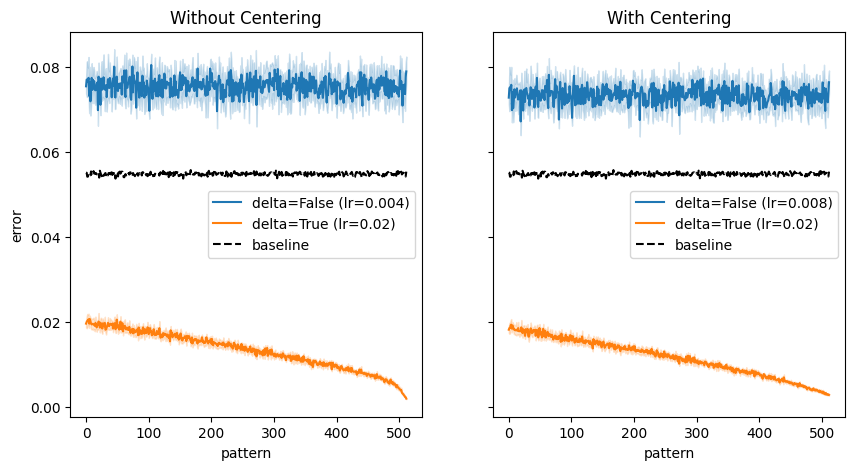

In [61]:
centering = [False, True]

fig, axes = plt.subplots(1, 2, figsize=(10,5), sharey=True)
for i, cent in enumerate(centering):
    ax = axes[i]
    sns.lineplot(data=df[df['centering'] == cent], x="pattern", y="error", hue="model", ax=ax)
    sns.lineplot(data=df[df['model'] == 'baseline'], x="pattern", y="error", color="black", linestyle="--", label = 'baseline', ax=ax)
    ax.set_title("With Centering" if cent else "Without Centering")

In [64]:
df_delta = df[df['delta'] == True]
df_delta[df_delta['centering'] == False]['error'].mean(), df_delta[df_delta['centering'] == True]['error'].mean()

(np.float64(0.013305141687237666), np.float64(0.011615323180194537))

Only the delta rule performs better than baseline. Centering slightly improves performance. 

### Evaluation

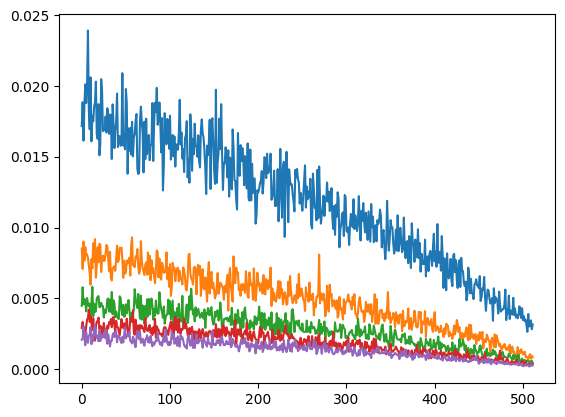

In [66]:
pcn.utils.seed(0)
g = torch.Generator()
g.manual_seed(0)

train_loader = DataLoader(
    tensor_dataset, 
    batch_size=1, 
    shuffle=True, # different order at each trial
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

pcn.utils.seed(0)
g = torch.Generator()
g.manual_seed(0)

test_loader = DataLoader(
    tensor_dataset, 
    batch_size=1, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=test_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=ca3_mean, 
    use_bias=True, 
    delta=True,
    act_fn=torch.tanh,
    f=1
)

model = PatternAssociator(
    in_size=n_ca3, 
    in_mean=ca3_mean,
    out_size=n_ec, 
    act_fn=torch.tanh, 
    use_bias=True, 
    c=1, 
    f=1, 
    delta=True,
    glorot_init=True
)
optimizer = pcn.optim.get_optim(
            [model.layer],
            "SGD",
            argmin,
            batch_scale=True,
            grad_clip=None,
            weight_decay=None
        )
trainer = PATrainer(model, optimizer)

num_epochs = 5
with torch.no_grad():
    for epoch in range(num_epochs):
        trainer.train(train_loader, 0) 
        errors = trainer.test(test_loader)    
        plt.plot(errors)

In [67]:
# Train error
np.mean(errors), np.mean(errors[-20:])

(np.float64(0.001416739411610024), np.float64(0.00029413313677650876))

In [44]:
seed = 0

# dataset params
train_size = None
test_size = None
normalize = True
batch_size = 64

# inference params
mu_dt = 0.01
n_test_iters = 200
n_max_iters = 20000
step_tolerance = 1e-5
init_std = 0.01
fixed_preds_test = False

# model params
use_bias = True
kaiming_init = False
n_vc = 2000
n_ec = 300
nodes = [n_ec, n_vc, 784]
act_fn = "tanh"
kaiming = False

In [45]:
dataset_name = 'cifar10'

if dataset_name == 'mnist':
    n_vc = 450
elif dataset_name == 'fmnist':
    n_vc = 750
else:
    n_vc = 2000
    size = (3, 32, 32)

nodes = [n_ec, n_vc, np.prod(size)]
    
model_name = f"pcn-{dataset_name}-n_vc={n_vc}-n_ec={n_ec}" 
pcmodel = PCModel(
    nodes=nodes, mu_dt=mu_dt, act_fn=act_fn, use_bias=use_bias, kaiming_init=kaiming_init
)
pcmodel.load_state_dict(torch.load(f"../unsupervised-pcn/models/{model_name}.pt", map_location=pcn.utils.DEVICE, weights_only=True))

<All keys matched successfully>

#### Visualization

In [79]:
preds = torch.zeros((N_train, n_ec))
targets = torch.zeros((N_train, n_ec))
for i, (input, target) in enumerate(test_loader):
    input = pcn.utils.set_tensor(input)
    pred = model(input)
    preds[i] = pred
    targets[i] = target

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3391014..1.3739564].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.509378..1.4508228].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.295188..1.3636082].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5772033..1.640173].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.328967..1.3447914].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8438756..1.6354688].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2430326..1

Text(0.5, 1.0, 'Reconstructed replay')

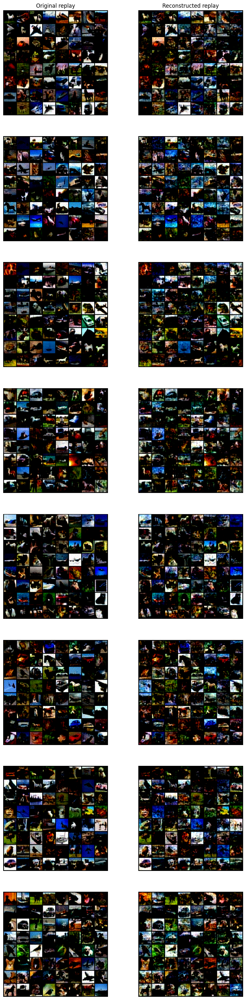

In [80]:
inp = targets
inp_hat = preds

n_batches = N_train//batch_size
fig, axes = plt.subplots(n_batches, 2, figsize = (10, 5*n_batches))

for i in range(n_batches):
    ec_batch = pcn.utils.set_tensor(inp[batch_size*i:batch_size*(i+1)])

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 0], pcmodel.preds[-1], size)

    ec_batch_hat = pcn.utils.set_tensor(inp_hat[batch_size*i:batch_size*(i+1)])

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch_hat, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 1], pcmodel.preds[-1], size)

axes[0, 0].set_title('Original replay')
axes[0, 1].set_title('Reconstructed replay')

#### Generalization performance

##### Unseen data

In [81]:
pcn.utils.seed(0)
g = torch.Generator()
g.manual_seed(0)

test_tensor_dataset = TensorDataset(dataset['ca3'][N_train:], dataset['ec'][N_train:])
test_test_loader = DataLoader(
    test_tensor_dataset, 
    batch_size=1, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

In [82]:
N_test = len(test_tensor_dataset)
with torch.no_grad():
    errors = trainer.test(test_test_loader)

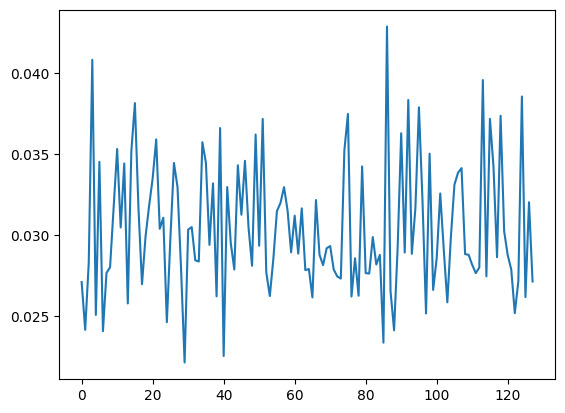

In [83]:
plt.plot(errors)

In [84]:
# Test error
np.mean(errors)

np.float64(0.03042650641873479)

In [85]:
test_preds = torch.zeros((N_test, n_ec))
test_targets = torch.zeros((N_test, n_ec))
for i, (input, target) in enumerate(test_test_loader):
    input = pcn.utils.set_tensor(input)
    pred = model(input)
    test_preds[i] = pred
    test_targets[i] = target

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.318218..1.3952272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.0041945..2.9844584].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2890795..1.3667433].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.1573703..3.1545405].


Text(0.5, 1.0, 'Reconstructed replay')

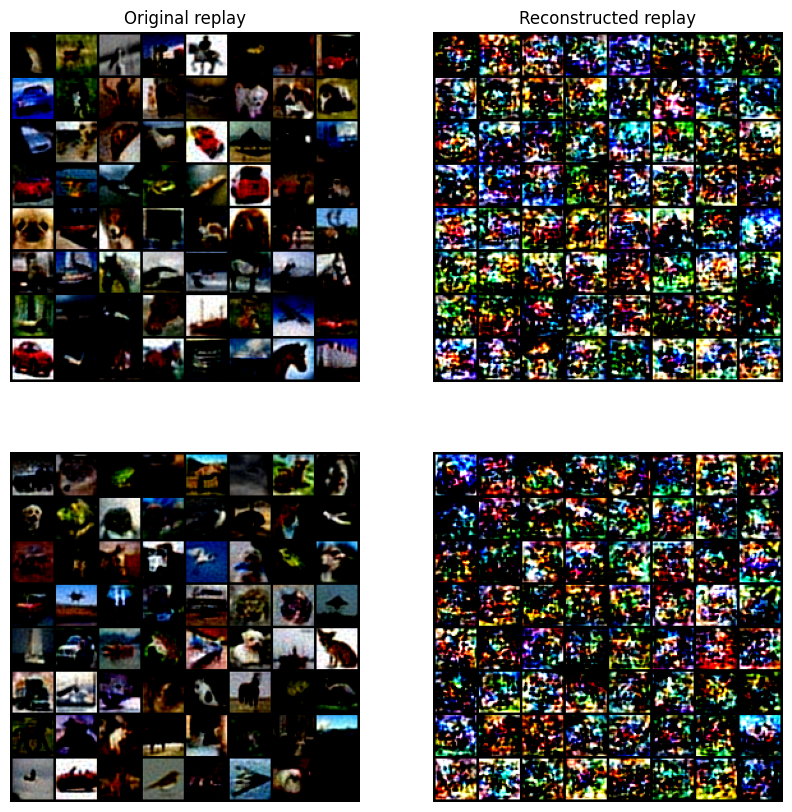

In [86]:
inp = test_targets
inp_hat = test_preds

n_batches = N_test//batch_size
fig, axes = plt.subplots(n_batches, 2, figsize = (10, 5*n_batches))

for i in range(n_batches):
    ec_batch = pcn.utils.set_tensor(inp[batch_size*i:batch_size*(i+1)])

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 0], pcmodel.preds[-1], size)

    ec_batch_hat = pcn.utils.set_tensor(inp_hat[batch_size*i:batch_size*(i+1)])

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch_hat, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 1], pcmodel.preds[-1], size)

axes[0, 0].set_title('Original replay')
axes[0, 1].set_title('Reconstructed replay')

##### Random data

In [91]:
batch_size = 64
ca3_samples = pcn.utils.sample_from_latent(dataset['ca3'].numpy(), batch_size)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2213442..2.2809186].


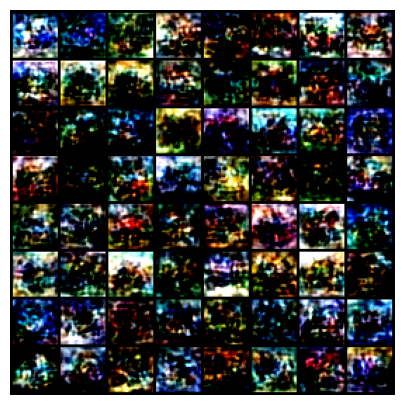

In [93]:
ca3_samples = pcn.utils.set_tensor(ca3_samples)
preds_samples = model.test_batch(ca3_samples)
inp_samples = preds_samples

with torch.no_grad():
    ec_samples = pcn.utils.set_tensor(inp_samples)
    pcmodel.replay_batch(
        ec_samples, 
        n_max_iters,
        step_tolerance=step_tolerance,
        init_std=init_std,
        fixed_preds=fixed_preds_test
    )
fig, ax = plt.subplots(1, 1, figsize=(5,5))
plotting.plot_samples(ax, pcmodel.preds[-1], size)

In [95]:
dataset['ca3']

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [1., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 1., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [1., 0., 0.,  ..., 0., 0., 0.]])

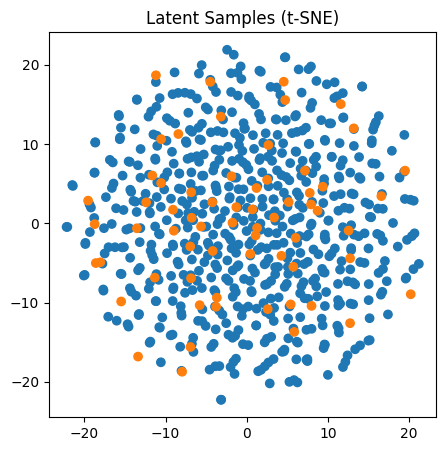

In [96]:
z = torch.cat((dataset['ca3'], ca3_samples.cpu()))
y = torch.tensor([0]*len(dataset['ca3']) + [1]*ca3_samples.shape[0])

fig, ax = plt.subplots(1, 1, figsize=(5,5))
plotting.visualize_latent(ax, z, y)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8644829..3.2219923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.3877757..2.8121922].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1988547..2.1968212].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.443328..2.1888022].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2786536..2.0623126].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.561599..2.47423].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.3074493..1

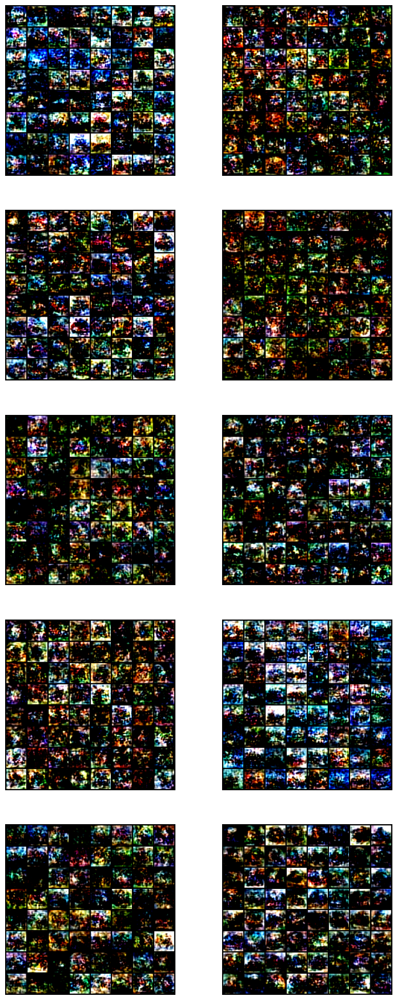

In [97]:
classes = dataset['labels'].int().unique().tolist()
n_rows = len(classes)//2 
fig, axes = plt.subplots(n_rows, 2, figsize=(10, 5*n_rows))
for c in classes:
    ax = axes[c%n_rows, c//n_rows]
    idx = dataset['labels'] == c
    ca3_samples = pcn.utils.sample_from_latent(dataset['ca3'][idx].numpy(), batch_size)
    ca3_samples = pcn.utils.set_tensor(ca3_samples)
    preds_samples = model.test_batch(ca3_samples)
    inp_samples = preds_samples

    with torch.no_grad():
        ec_samples = pcn.utils.set_tensor(inp_samples)
        pcmodel.replay_batch(
            ec_samples, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(ax, pcmodel.preds[-1], size)


### Training-validation-test sets

#### Small dataset

In [6]:
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

batch_size = 64

N = len(dataset['ca3'])
N_train = int(0.8*N)
N_test = N - N_train

x_train = dataset['ca3'][:N_train]
y_train = dataset['ec'][:N_train]
x_test = dataset['ca3'][N_train:]
y_test = dataset['ec'][N_train:]

x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=N_test, random_state=seed)
train_dataset = TensorDataset(x_train, y_train)
train_loader = DataLoader(
    train_dataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_dataset = TensorDataset(x_valid, y_valid)
valid_loader = DataLoader(
    valid_dataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

test_dataset = TensorDataset(x_test, y_test)
test_loader = DataLoader(
    test_dataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g # same order as for train_loader
) 

In [9]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=valid_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=ca3_mean, 
    use_bias=True, 
    delta=True,
    act_fn=torch.tanh,
    f=1
)

In [10]:
argmin, min

(0.8, np.float64(0.05143293924629688))

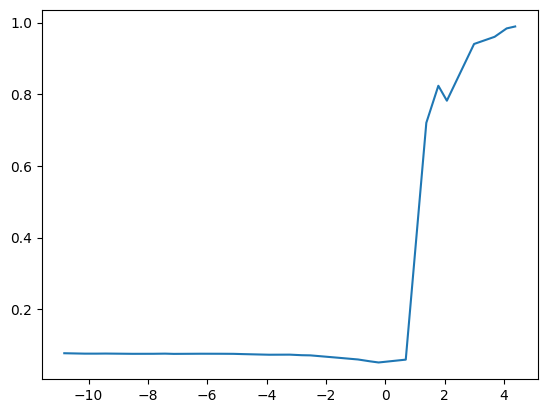

In [13]:
plt.plot(np.log(lrs), errors)

In [15]:
model = PatternAssociator(
    in_size=n_ca3, 
    in_mean=ca3_mean,
    out_size=n_ec, 
    act_fn=torch.tanh, 
    use_bias=True, 
    c=1, 
    f=1, 
    delta=True,
    glorot_init=True
)
optimizer = pcn.optim.get_optim(
            [model.layer],
            "SGD",
            argmin,
            batch_scale=True,
            grad_clip=None,
            weight_decay=None
        )
trainer = PATrainer(model, optimizer)

num_epochs = 50
errors_train = []
errors_valid = []
with torch.no_grad():
    for epoch in range(num_epochs):
        print(f'Epoch {epoch}:')
        
        trainer.train(train_loader, 0) 
        errors = trainer.test(train_loader)  
        error_train = np.mean(errors)  
        errors_train.append(error_train)

        inputs, targets = next(iter(valid_loader))
        error_valid = trainer.eval(inputs, targets)
        errors_valid.append(error_valid)

        print(f'Training error: {error_train:.3f}, validation error: {error_valid:.3f}')


Epoch 0:
Training error: 0.019, validation error: 0.052
Epoch 1:
Training error: 0.009, validation error: 0.045
Epoch 2:
Training error: 0.005, validation error: 0.044
Epoch 3:
Training error: 0.003, validation error: 0.042
Epoch 4:
Training error: 0.002, validation error: 0.041
Epoch 5:
Training error: 0.002, validation error: 0.041
Epoch 6:
Training error: 0.001, validation error: 0.040
Epoch 7:
Training error: 0.001, validation error: 0.039
Epoch 8:
Training error: 0.001, validation error: 0.040
Epoch 9:
Training error: 0.001, validation error: 0.040
Epoch 10:
Training error: 0.001, validation error: 0.040
Epoch 11:
Training error: 0.000, validation error: 0.040
Epoch 12:
Training error: 0.000, validation error: 0.040
Epoch 13:
Training error: 0.000, validation error: 0.039
Epoch 14:
Training error: 0.000, validation error: 0.039
Epoch 15:
Training error: 0.000, validation error: 0.040
Epoch 16:
Training error: 0.000, validation error: 0.040
Epoch 17:
Training error: 0.000, validati

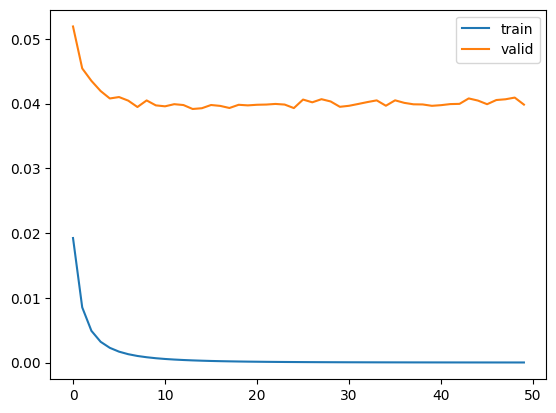

In [16]:
plt.plot(errors_train, label='train')
plt.plot(errors_valid, label='valid')
plt.legend()

In [17]:
np.argmin(errors_train), np.min(errors_train)

(np.int64(49), np.float64(5.609581421595067e-06))

In [19]:
p = n_ec/(1.1*10**5)
n_ca1 = round(3.9*10**5*p)

In [20]:
N_train, n_ca3*n_ec, n_ca3*n_ca1+n_ca1*n_ec

(512, 204600, 1044848)

#### Full dataset

In [7]:
train_dataset = torch.load('./data/cifar10_train.pt')
x_train = train_dataset['ca3']
y_train = train_dataset['ec']

valid_dataset = torch.load('./data/cifar10_valid.pt')
x_valid = valid_dataset['ca3']
y_valid = valid_dataset['ec']

test_dataset = torch.load('./data/cifar10_test.pt')
x_test = test_dataset['ca3']
y_test = test_dataset['ec']

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_38244\2714994090.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_dataset = torch.load('./data/cifar10_train.pt')
C:\

In [8]:
n_ca3 = train_dataset['ca3'].shape[1]
n_ec = train_dataset['ec'].shape[1]
ca3_mean = train_dataset['ca3'].mean(dim=0)

In [11]:
batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset = TensorDataset(x_train, y_train)
train_loader = DataLoader(
    train_tensordataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset = TensorDataset(x_valid, y_valid)
valid_loader = DataLoader(
    valid_tensordataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

test_tensordataset = TensorDataset(x_test, y_test)
test_loader = DataLoader(
    test_tensordataset, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g # same order as for train_loader
)

In [17]:
(argmin, min), errors = utils.best_lr(
    lrs=lrs, 
    train_loader=train_loader, 
    test_loader=valid_loader,
    in_size=n_ca3, 
    out_size=n_ec, 
    in_mean=ca3_mean, 
    use_bias=True, 
    delta=True,
    act_fn=torch.tanh,
    f=1
)

In [18]:
argmin, min

(0.2, np.float64(0.0046813909803182846))

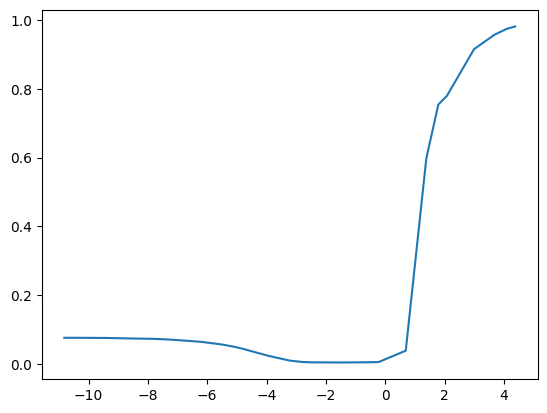

In [19]:
plt.plot(np.log(lrs), errors)

In [59]:
model = PatternAssociator(
    in_size=n_ca3, 
    in_mean=ca3_mean,
    out_size=n_ec, 
    act_fn=torch.tanh, 
    use_bias=True, 
    c=1, 
    f=1, 
    delta=True,
    glorot_init=True
)
lr = 0.01
optimizer = pcn.optim.get_optim(
            [model.layer],
            "SGD",
            lr,
            batch_scale=True,
            grad_clip=None,
            weight_decay=None
        )
trainer = PATrainer(model, optimizer)

num_epochs = 50
errors_train = []
errors_valid = []
with torch.no_grad():
    for epoch in range(num_epochs):        
        
        trainer.train(train_loader, 0) 
        errors = trainer.test(train_loader)  
        error_train = np.mean(errors)  
        errors_train.append(error_train)

        inputs, targets = next(iter(valid_loader))
        error_valid = trainer.eval(inputs, targets)
        errors_valid.append(error_valid)

        if (epoch + 1) % 5 == 0:
            print(f'Epoch {epoch+1}. Training error: {error_train:.3f}. Validation error: {error_valid:.3f}')


Epoch 4. Training error: 0.008. Validation error: 0.008
Epoch 9. Training error: 0.005. Validation error: 0.005
Epoch 14. Training error: 0.004. Validation error: 0.005
Epoch 19. Training error: 0.004. Validation error: 0.004
Epoch 24. Training error: 0.004. Validation error: 0.005
Epoch 29. Training error: 0.004. Validation error: 0.004
Epoch 34. Training error: 0.004. Validation error: 0.005
Epoch 39. Training error: 0.004. Validation error: 0.004
Epoch 44. Training error: 0.004. Validation error: 0.005
Epoch 49. Training error: 0.004. Validation error: 0.004


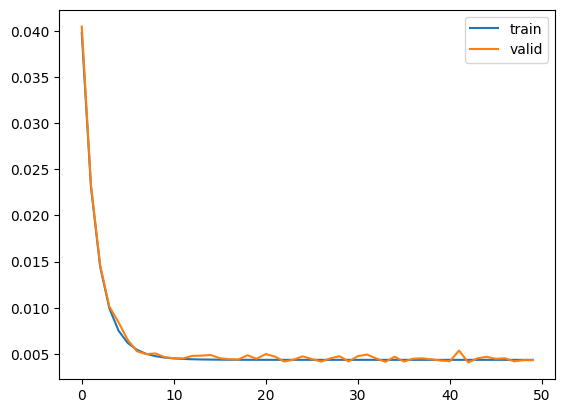

In [60]:
plt.plot(errors_train, label='train')
plt.plot(errors_valid, label='valid')
plt.legend()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.326916..1.3557876].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.125092..1.0560076].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3433944..1.4118493].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1813545..1.2043734].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2337283..1.2427413].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.27634..1.360522].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2738032..1.

Text(0.5, 1.0, 'Reconstructed replay')

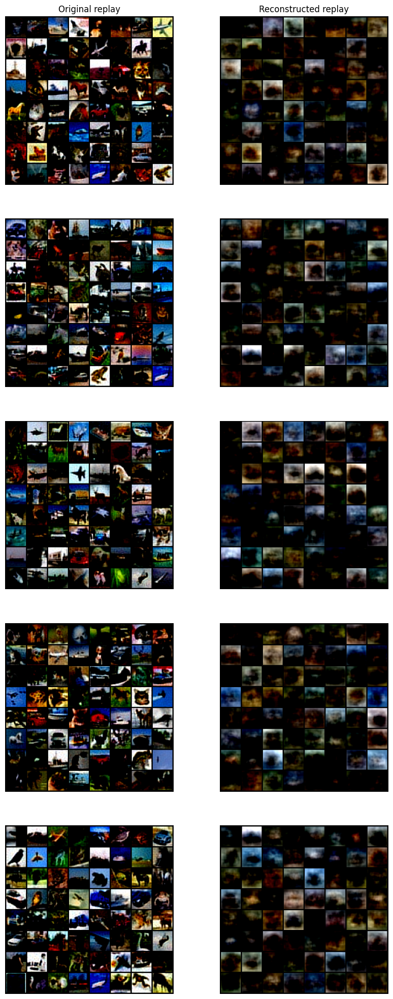

In [47]:
n_batches = 5
fig, axes = plt.subplots(n_batches, 2, figsize = (10, 5*n_batches))

for i in range(n_batches):
    ca3_batch, ec_batch = next(iter(train_loader))
    ec_batch = pcn.utils.set_tensor(ec_batch)

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 0], pcmodel.preds[-1], size)

    ca3_batch = pcn.utils.set_tensor(ca3_batch)
    ec_batch_hat = model(ca3_batch)

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch_hat, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 1], pcmodel.preds[-1], size)

axes[0, 0].set_title('Original replay')
axes[0, 1].set_title('Reconstructed replay')

In [19]:
with torch.no_grad():
    errors = trainer.test(test_loader)

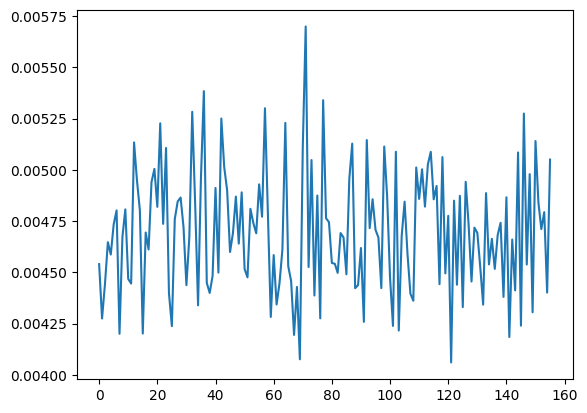

In [20]:
plt.plot(errors)

In [21]:
# Test error
np.mean(errors)

np.float64(0.004698832193986537)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3564785..1.3506788].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.21776..1.1039361].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2751184..1.2737511].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1648984..1.0116024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3370488..1.3088502].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3001131..1.3459635].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.405315..

Text(0.5, 1.0, 'Reconstructed replay')

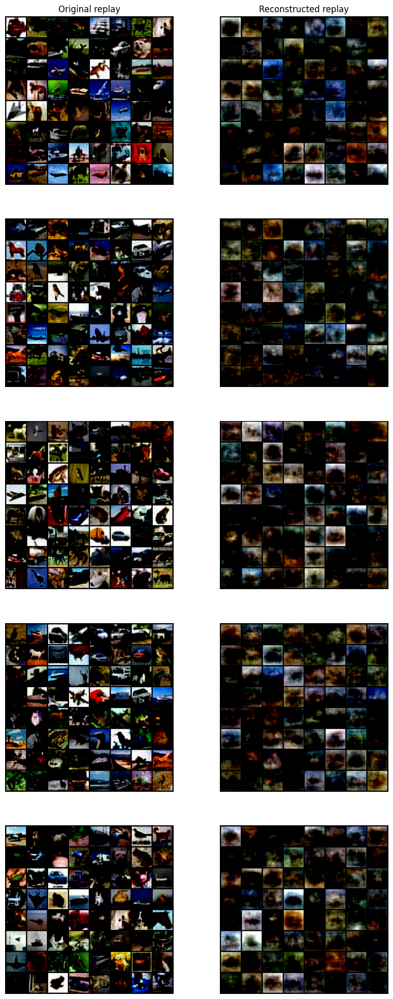

In [ ]:
n_batches = 5
fig, axes = plt.subplots(n_batches, 2, figsize = (10, 5*n_batches))

for i in range(n_batches):
    ca3_batch, ec_batch = next(iter(test_loader))
    ec_batch = pcn.utils.set_tensor(ec_batch)

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 0], pcmodel.preds[-1], size)

    ca3_batch = pcn.utils.set_tensor(ca3_batch)
    ec_batch_hat = model(ca3_batch)

    with torch.no_grad():
        pcmodel.replay_batch(
            ec_batch_hat, 
            n_max_iters,
            step_tolerance=step_tolerance,
            init_std=init_std,
            fixed_preds=fixed_preds_test
        )
    plotting.plot_samples(axes[i, 1], pcmodel.preds[-1], size)

axes[0, 0].set_title('Original replay')
axes[0, 1].set_title('Reconstructed replay')

## MLP with CA1 hidden layer

In [ ]:
n_sub = round(2.9*10**5*p)

In [29]:
n_ca1, n_sub

(1064, 791)

### Standard MLP

In [14]:
def train_model(model, train_loader, valid_loader, optimizer, criterion, device, regularization_type='L2', lambda_reg=1e-6, n_epochs=50):
    errors_train = []
    errors_valid = []

    # Set the model to training mode - important for batch normalization and dropout layers.
    # Unnecessary here but added for best practices
    model.train()

    # Train the model
    for epoch in range(n_epochs):
        # Total loss for epoch, divided by number of batches to obtain mean loss
        epoch_loss = 0

        # For each batch of data
        for x_batch, y_batch in train_loader:
            # Forward pass
            x_batch = x_batch.to(device)
            y_pred = model(x_batch)

            # Compute loss value
            y_batch = y_batch.to(device)
            loss = criterion(y_pred, y_batch)

            # Apply L1 regularization
            if regularization_type == 'L1':
                l1_norm = sum(p.abs().sum() for p in model.parameters())
                loss += lambda_reg * l1_norm
            
            # Apply L2 regularization
            elif regularization_type == 'L2':
                l2_norm = sum(p.pow(2).sum() for p in model.parameters())
                loss += lambda_reg * l2_norm

            # Gradient descent step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            with torch.no_grad():
                # Accumulate data for epoch metrics: loss
                epoch_loss += loss.item()


        # Compute epoch metrics
        mean_loss = epoch_loss / len(train_loader)
        errors_train.append(mean_loss)



        if (epoch + 1) % 5 == 0:

            with torch.no_grad():
                total_loss_valid = 0
                for x_valid, y_valid in valid_loader:
                    x_valid = x_valid.to(device)
                    y_valid_pred = model(x_valid)

                    # Compute loss value
                    y_valid = y_valid.to(device)
                    loss_valid = criterion(y_valid_pred, y_valid).item()
                
                    total_loss_valid += loss_valid
                mean_loss_valid = total_loss_valid / len(valid_loader)

            errors_valid.append(mean_loss_valid)
            
            print(
                f"Epoch [{(epoch + 1):3}/{n_epochs:3}] finished. Training loss: {mean_loss:.5f}. Validation loss: {mean_loss_valid:.5f}."
            )
    return errors_train, errors_valid

### Full TopK and Heaviside

In [38]:
device = pcn.utils.DEVICE

model = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.Tanh(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [42]:
errors_train, errors_valid = train_model(model, train_loader, valid_loader, optimizer, criterion, device, lambda_reg=0)

Epoch [  5/ 50] finished. Training loss: 0.00452. Validation loss: 0.00452.
Epoch [ 10/ 50] finished. Training loss: 0.00451. Validation loss: 0.00452.
Epoch [ 15/ 50] finished. Training loss: 0.00450. Validation loss: 0.00451.
Epoch [ 20/ 50] finished. Training loss: 0.00449. Validation loss: 0.00451.
Epoch [ 25/ 50] finished. Training loss: 0.00449. Validation loss: 0.00451.
Epoch [ 30/ 50] finished. Training loss: 0.00448. Validation loss: 0.00450.
Epoch [ 35/ 50] finished. Training loss: 0.00448. Validation loss: 0.00450.
Epoch [ 40/ 50] finished. Training loss: 0.00447. Validation loss: 0.00450.
Epoch [ 45/ 50] finished. Training loss: 0.00447. Validation loss: 0.00450.
Epoch [ 50/ 50] finished. Training loss: 0.00446. Validation loss: 0.00450.


In [47]:
errors_valid

[0.004522922095090438,
 0.004518402406038382,
 0.004512955783866346,
 0.004507515367526465,
 0.004507895582952561,
 0.004502213913768243,
 0.0045034224868943104,
 0.004501373041421175,
 0.004499052597496372,
 0.004495114604464899]

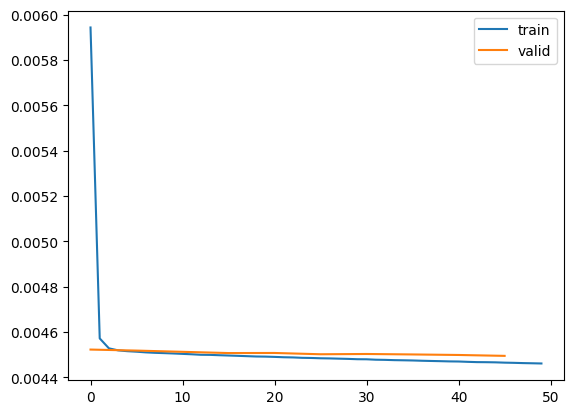

In [48]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(10)], errors_valid, label='valid')
plt.legend()

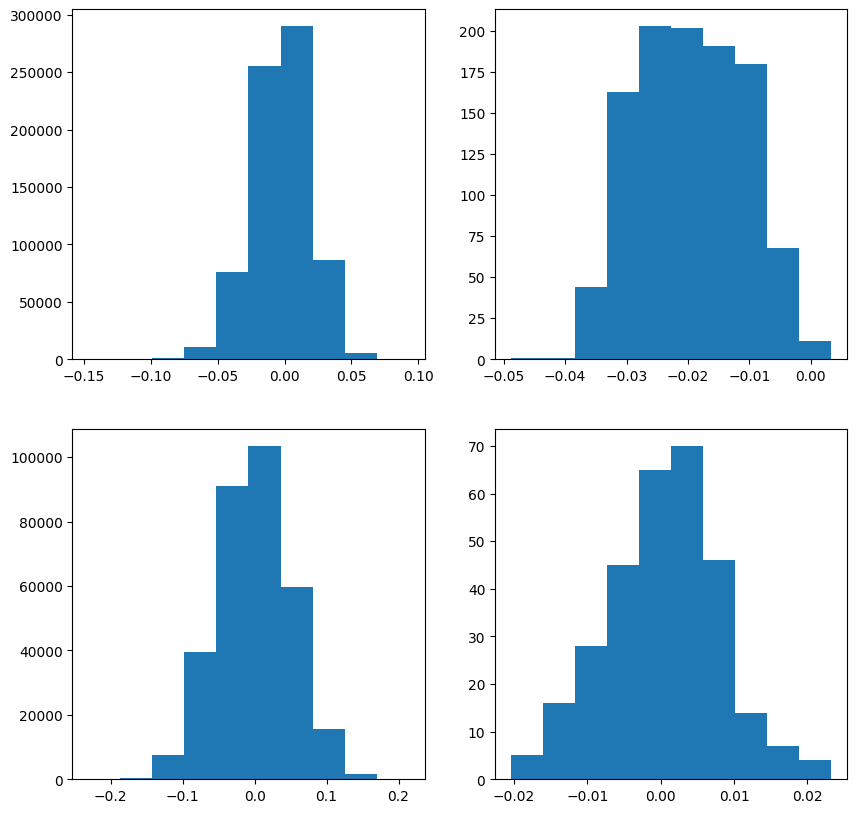

In [53]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
for i in range(2):
    axes[i, 0].hist(model[i][0].weight.cpu().detach().numpy().flatten())
    axes[i, 1].hist(model[i][0].bias.cpu().detach().numpy().flatten())

(array([6.118e+04, 3.546e+03, 1.909e+03, 8.950e+02, 3.700e+02, 1.330e+02,
        4.300e+01, 1.200e+01, 4.000e+00, 4.000e+00]),
 array([0.        , 0.04544045, 0.09088089, 0.13632134, 0.18176179,
        0.22720224, 0.27264267, 0.31808314, 0.36352357, 0.40896401,
        0.45440447]),
 <BarContainer object of 10 artists>)

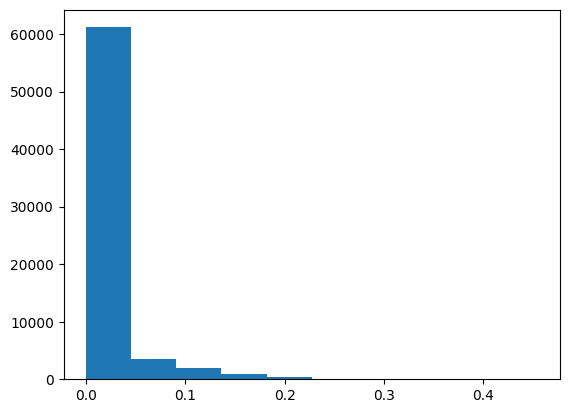

In [54]:
plt.hist(h_pred.cpu().detach().numpy().flatten())

In [55]:
h_pred.mean()

tensor(0.0122, device='cuda:0', grad_fn=<MeanBackward0>)

In [7]:
n_ca3, n_ca1, n_ec

(682, 1064, 300)

In [66]:
x_test.unique(dim=0).shape

torch.Size([9984, 682])

### Continuous encoding

#### Sigmoid

In [6]:
act_fn = "sigmoid"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn}_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_30992\3409111349.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}

In [7]:
device = pcn.utils.DEVICE

In [34]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.Tanh(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

# model_soft = nn.Sequential(
#     nn.Linear(in_features=n_ca3, out_features=n_ca1),
#     nn.Sigmoid(), 
#     nn.Linear(in_features=n_ca1, out_features=n_sub),
#     nn.Sigmoid(),
#     nn.Linear(in_features=n_sub, out_features=n_ec),
#     nn.Tanh()
# ).to(device)

criterion = nn.MSELoss()
lr = 3e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [35]:
n_epochs = 100
errors_train, errors_valid = train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device, 
    lambda_reg=0, 
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00196. Validation loss: 0.00182.
Epoch [ 10/100] finished. Training loss: 0.00120. Validation loss: 0.00120.
Epoch [ 15/100] finished. Training loss: 0.00091. Validation loss: 0.00086.
Epoch [ 20/100] finished. Training loss: 0.00077. Validation loss: 0.00075.
Epoch [ 25/100] finished. Training loss: 0.00070. Validation loss: 0.00063.
Epoch [ 30/100] finished. Training loss: 0.00065. Validation loss: 0.00064.
Epoch [ 35/100] finished. Training loss: 0.00061. Validation loss: 0.00059.
Epoch [ 40/100] finished. Training loss: 0.00058. Validation loss: 0.00059.
Epoch [ 45/100] finished. Training loss: 0.00056. Validation loss: 0.00053.
Epoch [ 50/100] finished. Training loss: 0.00053. Validation loss: 0.00053.
Epoch [ 55/100] finished. Training loss: 0.00051. Validation loss: 0.00050.
Epoch [ 60/100] finished. Training loss: 0.00049. Validation loss: 0.00050.
Epoch [ 65/100] finished. Training loss: 0.00048. Validation loss: 0.00045.
Epoch [ 70/1

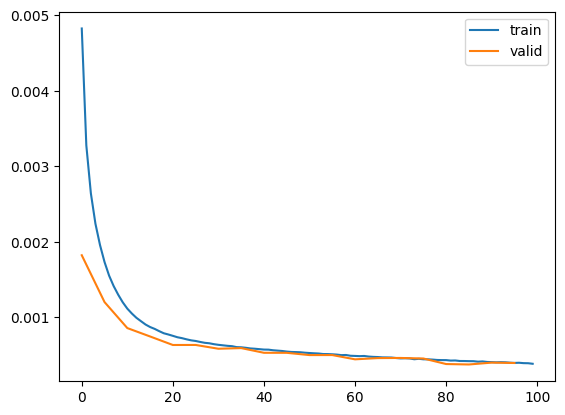

In [36]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

In [ ]:
x_soft_train

tensor([[0.5139, 0.3361, 0.5149,  ..., 0.5625, 0.6626, 0.8330],
        [0.4882, 0.3284, 0.5339,  ..., 0.5100, 0.7070, 0.8321],
        [0.5154, 0.3304, 0.5291,  ..., 0.4847, 0.7007, 0.8074],
        ...,
        [0.5250, 0.3417, 0.5350,  ..., 0.5357, 0.6970, 0.8334],
        [0.5198, 0.3380, 0.5615,  ..., 0.5452, 0.6815, 0.8173],
        [0.4987, 0.3198, 0.5581,  ..., 0.4881, 0.6835, 0.8135]])

#### Rank of Jacobian

In [ ]:
p = n_ec/(1.1*10**5)
n_dg = round(1.2*10**6*p)

In [9]:
_act_fn = torch.sigmoid if act_fn == "sigmoid" else torch.relu

EC_DG = SparseLayer(
    in_size=n_ec, 
    out_size=n_dg, 
    act_fn=_act_fn,
    c=1,
    f=1
)
EC_DG.load_state_dict(torch.load(f'models/EC_DG_{act_fn}.pt', weights_only=True))

DG_CA3 = SparseLayer(
    in_size=n_dg,
    out_size=n_ca3, 
    act_fn=_act_fn,
    c=1,
    f=1
)
DG_CA3.load_state_dict(torch.load(f'models/DG_CA3_{act_fn}.pt', weights_only=True))

f = nn.Sequential(EC_DG, DG_CA3).to(device)

In [10]:
from torch.autograd.functional import jacobian

torch.autograd.set_detect_anomaly(True)

def f_single(x):
    return f(x.unsqueeze(0)).squeeze(0)

x = y_soft_train[0].to(device)
J = jacobian(f_single, x)

In [11]:
J.shape

torch.Size([682, 300])

In [12]:
u, s, v = torch.linalg.svd(J)

In [13]:
s

tensor([0.5762, 0.5643, 0.5590, 0.5560, 0.5482, 0.5437, 0.5410, 0.5358, 0.5317,
        0.5290, 0.5237, 0.5203, 0.5189, 0.5154, 0.5145, 0.5097, 0.5057, 0.5049,
        0.5021, 0.4972, 0.4953, 0.4922, 0.4902, 0.4886, 0.4858, 0.4845, 0.4835,
        0.4800, 0.4790, 0.4761, 0.4737, 0.4701, 0.4685, 0.4656, 0.4642, 0.4612,
        0.4611, 0.4584, 0.4564, 0.4547, 0.4525, 0.4507, 0.4477, 0.4458, 0.4443,
        0.4427, 0.4401, 0.4368, 0.4353, 0.4328, 0.4319, 0.4289, 0.4276, 0.4266,
        0.4245, 0.4207, 0.4185, 0.4181, 0.4162, 0.4151, 0.4131, 0.4117, 0.4110,
        0.4073, 0.4065, 0.4036, 0.4023, 0.4009, 0.3995, 0.3976, 0.3955, 0.3943,
        0.3905, 0.3888, 0.3885, 0.3876, 0.3867, 0.3855, 0.3835, 0.3824, 0.3797,
        0.3780, 0.3757, 0.3739, 0.3732, 0.3723, 0.3705, 0.3691, 0.3686, 0.3672,
        0.3660, 0.3643, 0.3609, 0.3599, 0.3592, 0.3578, 0.3562, 0.3544, 0.3522,
        0.3507, 0.3490, 0.3474, 0.3449, 0.3437, 0.3422, 0.3412, 0.3390, 0.3377,
        0.3356, 0.3345, 0.3337, 0.3321, 

In [14]:
s[0]/s[-1]

tensor(6.0714, device='cuda:0')

In [37]:
0.01*n_dg, 0.06*n_ca3

(32.730000000000004, 40.92)

#### ReLU

In [6]:
act_fn = "relu"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn}_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_10444\3729186.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_tr

In [7]:
device = pcn.utils.DEVICE

In [ ]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.ReLU(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [25]:
n_epochs = 100
errors_train, errors_valid = train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device, 
    lambda_reg=0, 
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00219. Validation loss: 0.00210.
Epoch [ 10/100] finished. Training loss: 0.00163. Validation loss: 0.00161.
Epoch [ 15/100] finished. Training loss: 0.00143. Validation loss: 0.00144.
Epoch [ 20/100] finished. Training loss: 0.00134. Validation loss: 0.00136.
Epoch [ 25/100] finished. Training loss: 0.00129. Validation loss: 0.00131.
Epoch [ 30/100] finished. Training loss: 0.00126. Validation loss: 0.00129.
Epoch [ 35/100] finished. Training loss: 0.00124. Validation loss: 0.00127.
Epoch [ 40/100] finished. Training loss: 0.00123. Validation loss: 0.00126.
Epoch [ 45/100] finished. Training loss: 0.00122. Validation loss: 0.00125.
Epoch [ 50/100] finished. Training loss: 0.00121. Validation loss: 0.00125.
Epoch [ 55/100] finished. Training loss: 0.00120. Validation loss: 0.00124.
Epoch [ 60/100] finished. Training loss: 0.00120. Validation loss: 0.00124.
Epoch [ 65/100] finished. Training loss: 0.00119. Validation loss: 0.00123.
Epoch [ 70/1

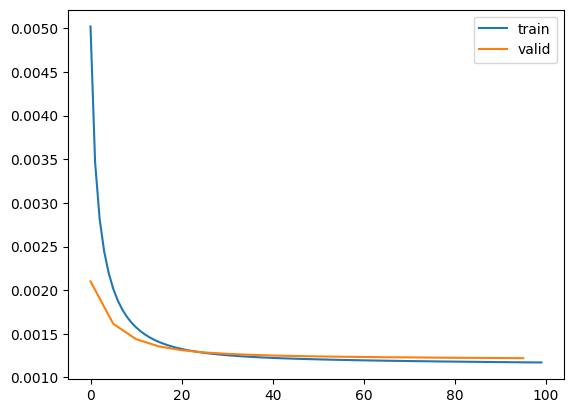

In [26]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

#### ReLU TopK

In [20]:
act_fn = "relu"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_sparse_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn}_sparse_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_48692\2757402860.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}

In [21]:
device = pcn.utils.DEVICE

In [22]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.ReLU(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [24]:
n_epochs = 100
errors_train, errors_valid = utils.train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device,
    lambda_reg=0,  
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00495. Validation loss: 0.00490.
Epoch [ 10/100] finished. Training loss: 0.00476. Validation loss: 0.00475.
Epoch [ 15/100] finished. Training loss: 0.00467. Validation loss: 0.00468.
Epoch [ 20/100] finished. Training loss: 0.00460. Validation loss: 0.00464.
Epoch [ 25/100] finished. Training loss: 0.00455. Validation loss: 0.00461.
Epoch [ 30/100] finished. Training loss: 0.00450. Validation loss: 0.00458.
Epoch [ 35/100] finished. Training loss: 0.00446. Validation loss: 0.00456.
Epoch [ 40/100] finished. Training loss: 0.00442. Validation loss: 0.00454.
Epoch [ 45/100] finished. Training loss: 0.00438. Validation loss: 0.00453.
Epoch [ 50/100] finished. Training loss: 0.00435. Validation loss: 0.00452.
Epoch [ 55/100] finished. Training loss: 0.00431. Validation loss: 0.00451.
Epoch [ 60/100] finished. Training loss: 0.00427. Validation loss: 0.00450.
Epoch [ 65/100] finished. Training loss: 0.00424. Validation loss: 0.00449.
Epoch [ 70/1

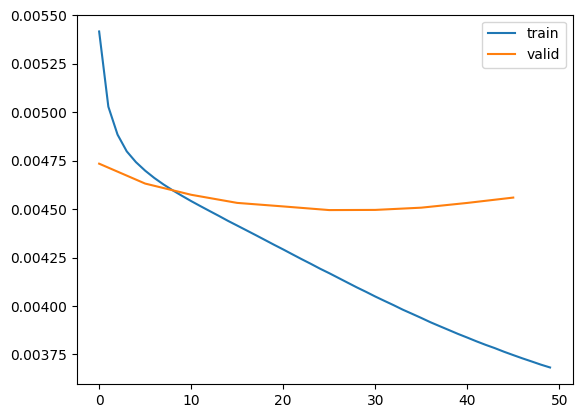

In [47]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

In [1]:
import math 
math.comb(682, 41)

1342467218595337619169821060710660649866797194138221228655171002530

#### ReLU Top K CA3

In [8]:
act_fn = "relu"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_ca3-sparse_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn}_ca3-sparse_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_38324\613303442.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_

In [9]:
device = pcn.utils.DEVICE

In [12]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.ReLU(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [18]:
n_epochs = 100
errors_train, errors_valid = train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device,
    lambda_reg=0,  
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00382. Validation loss: 0.00282.
Epoch [ 10/100] finished. Training loss: 0.00340. Validation loss: 0.00285.
Epoch [ 15/100] finished. Training loss: 0.00328. Validation loss: 0.00287.
Epoch [ 20/100] finished. Training loss: 0.00324. Validation loss: 0.00289.
Epoch [ 25/100] finished. Training loss: 0.00323. Validation loss: 0.00290.
Epoch [ 30/100] finished. Training loss: 0.00322. Validation loss: 0.00290.
Epoch [ 35/100] finished. Training loss: 0.00322. Validation loss: 0.00290.
Epoch [ 40/100] finished. Training loss: 0.00321. Validation loss: 0.00290.
Epoch [ 45/100] finished. Training loss: 0.00321. Validation loss: 0.00290.
Epoch [ 50/100] finished. Training loss: 0.00321. Validation loss: 0.00290.
Epoch [ 55/100] finished. Training loss: 0.00320. Validation loss: 0.00290.
Epoch [ 60/100] finished. Training loss: 0.00320. Validation loss: 0.00290.


KeyboardInterrupt: 

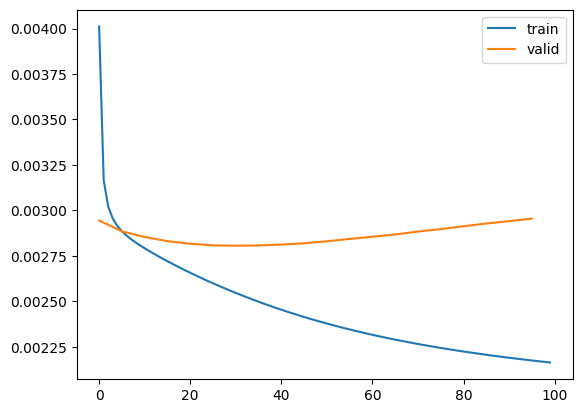

In [17]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

#### LeakyReLU TopK CA3

In [31]:
negative_slope1 = 0.01
act_fn1 = f"leaky_relu_{negative_slope1}"
negative_slope2 = 0.1
act_fn2 = f"leaky_relu_{negative_slope2}"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn1}_{act_fn2}_ca3-sparse_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn1}_{act_fn2}_ca3-sparse_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_51212\3411390848.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn1

In [28]:
device = pcn.utils.DEVICE

In [32]:

model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.LeakyReLU(negative_slope=negative_slope1), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-5
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [33]:
n_epochs = 200
errors_train, errors_valid = train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device,
    lambda_reg=0,  
    n_epochs=n_epochs)

Epoch [  5/200] finished. Training loss: 0.00326. Validation loss: 0.00320.
Epoch [ 10/200] finished. Training loss: 0.00284. Validation loss: 0.00286.
Epoch [ 15/200] finished. Training loss: 0.00270. Validation loss: 0.00275.
Epoch [ 20/200] finished. Training loss: 0.00263. Validation loss: 0.00270.
Epoch [ 25/200] finished. Training loss: 0.00259. Validation loss: 0.00267.
Epoch [ 30/200] finished. Training loss: 0.00257. Validation loss: 0.00265.
Epoch [ 35/200] finished. Training loss: 0.00255. Validation loss: 0.00264.
Epoch [ 40/200] finished. Training loss: 0.00253. Validation loss: 0.00264.
Epoch [ 45/200] finished. Training loss: 0.00252. Validation loss: 0.00263.
Epoch [ 50/200] finished. Training loss: 0.00251. Validation loss: 0.00263.
Epoch [ 55/200] finished. Training loss: 0.00250. Validation loss: 0.00262.
Epoch [ 60/200] finished. Training loss: 0.00249. Validation loss: 0.00262.
Epoch [ 65/200] finished. Training loss: 0.00248. Validation loss: 0.00262.
Epoch [ 70/2

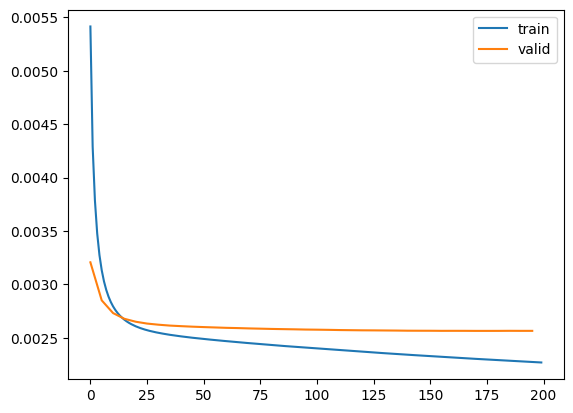

In [22]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

#### ReLU Top K DG

In [7]:
act_fn = "relu"

cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}_dg-sparse_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_{act_fn}_dg-sparse_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_22956\2288491263.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_{act_fn}

In [8]:
device = pcn.utils.DEVICE

In [11]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.ReLU(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [15]:
n_epochs = 100
errors_train, errors_valid = train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device,
    lambda_reg=0,  
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00397. Validation loss: 0.00396.
Epoch [ 10/100] finished. Training loss: 0.00378. Validation loss: 0.00383.
Epoch [ 15/100] finished. Training loss: 0.00367. Validation loss: 0.00376.
Epoch [ 20/100] finished. Training loss: 0.00357. Validation loss: 0.00370.
Epoch [ 25/100] finished. Training loss: 0.00349. Validation loss: 0.00366.
Epoch [ 30/100] finished. Training loss: 0.00341. Validation loss: 0.00363.
Epoch [ 35/100] finished. Training loss: 0.00334. Validation loss: 0.00360.
Epoch [ 40/100] finished. Training loss: 0.00327. Validation loss: 0.00359.
Epoch [ 45/100] finished. Training loss: 0.00321. Validation loss: 0.00357.
Epoch [ 50/100] finished. Training loss: 0.00315. Validation loss: 0.00357.
Epoch [ 55/100] finished. Training loss: 0.00310. Validation loss: 0.00356.
Epoch [ 60/100] finished. Training loss: 0.00305. Validation loss: 0.00356.
Epoch [ 65/100] finished. Training loss: 0.00301. Validation loss: 0.00357.
Epoch [ 70/1

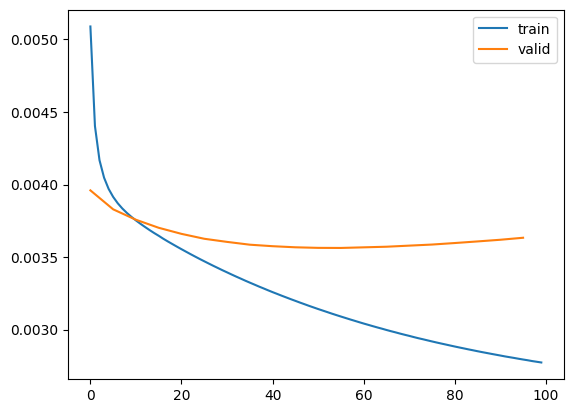

In [16]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

### Binary encoding with low sparsity

In [34]:
cifar10_soft_train = torch.load(f'./data/cifar10_relu_heaviside_dense_train.pt')
cifar10_soft_valid = torch.load(f'./data/cifar10_relu_heaviside_dense_valid.pt')

x_soft_train, y_soft_train = cifar10_soft_train['ca3'], cifar10_soft_train['ec']
x_soft_valid, y_soft_valid = cifar10_soft_valid['ca3'], cifar10_soft_valid['ec']

batch_size = 64
seed = 0
pcn.utils.seed(seed)
g = torch.Generator()
g.manual_seed(seed)

train_tensordataset_soft = TensorDataset(x_soft_train, y_soft_train)
train_loader_soft = DataLoader(
    train_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

valid_tensordataset_soft = TensorDataset(x_soft_valid, y_soft_valid)
valid_loader_soft = DataLoader(
    valid_tensordataset_soft, 
    batch_size, 
    shuffle=True, 
    worker_init_fn=pcn.utils.seed_worker, 
    generator=g
)

C:\Users\lucfonta\AppData\Local\Temp\ipykernel_7688\2615959949.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cifar10_soft_train = torch.load(f'./data/cifar10_relu_heav

In [35]:
device = pcn.utils.DEVICE

In [36]:
model_soft = nn.Sequential(
    nn.Linear(in_features=n_ca3, out_features=n_ca1),
    nn.ReLU(), 
    nn.Linear(in_features=n_ca1, out_features=n_ec),
    nn.Tanh()
).to(device)

criterion = nn.MSELoss()
lr = 1e-4
optimizer_soft = torch.optim.Adam(model_soft.parameters(), lr=lr)


In [37]:
n_epochs = 100
errors_train, errors_valid = utils.train_model(
    model_soft, 
    train_loader_soft, 
    valid_loader_soft, 
    optimizer_soft, 
    criterion, 
    device,
    lambda_reg=0,  
    n_epochs=n_epochs)

Epoch [  5/100] finished. Training loss: 0.00244. Validation loss: 0.00242.
Epoch [ 10/100] finished. Training loss: 0.00218. Validation loss: 0.00221.
Epoch [ 15/100] finished. Training loss: 0.00202. Validation loss: 0.00212.
Epoch [ 20/100] finished. Training loss: 0.00189. Validation loss: 0.00208.
Epoch [ 25/100] finished. Training loss: 0.00181. Validation loss: 0.00207.
Epoch [ 30/100] finished. Training loss: 0.00174. Validation loss: 0.00206.
Epoch [ 35/100] finished. Training loss: 0.00170. Validation loss: 0.00206.
Epoch [ 40/100] finished. Training loss: 0.00166. Validation loss: 0.00207.
Epoch [ 45/100] finished. Training loss: 0.00163. Validation loss: 0.00208.
Epoch [ 50/100] finished. Training loss: 0.00161. Validation loss: 0.00209.
Epoch [ 55/100] finished. Training loss: 0.00159. Validation loss: 0.00210.
Epoch [ 60/100] finished. Training loss: 0.00158. Validation loss: 0.00212.
Epoch [ 65/100] finished. Training loss: 0.00156. Validation loss: 0.00212.
Epoch [ 70/1

KeyboardInterrupt: 

In [38]:
plt.plot(errors_train, label='train')
plt.plot([5*i for i in range(n_epochs//5)], errors_valid, label='valid')
plt.legend()

NameError: name 'errors_train' is not defined